#My first ML project: Forest fires
In this instance, we will be exploring the data regarding to Hong Kong forest fires. <br>

notebook by Elon Wong

##Task 1: Introduction
In this instance, we will be exploring the data regarding to Hong Kong forest fires.

Stated by WHO, forest fires are one of the major environmental concerns that cause significant damages to natural resources, economic activities, and human lives. Forest fires can destroy hundreds of millions of hectares of land, affect the biodiversity and ecological balance, and contribute to global warming and climate change(WHO. n.d.). Therefore, predicting forest fires is a critical task to prevent and mitigate this threat.

Mechine learning enables computers to learn form data and make predictions. In this case, forest fire, a complex and dynamic phenomenon influenced by various factors such as weather, vegetation, topography, and human activities. Mechine learning algorithms can analyze historical and real-time data, to seek patterns and trends that indicate risks of fire appearing.

---



Data given has the columns: "Day", "Month", "Temp"<br>
"RH" relative humidity<br>
"Ws" wind speed<br>
"Rain" total day rain in mm<br>
"FFMC" Fine Fuel Moisture Code<br>
"DMC" Duff moisture Code<br>
"DC" Drought Code<br>
"ISI" Initital Spread Index<br>
"BUI" Buildup Index<br>
"FWI" Fire Weather Index<br>
"Label" Or "Target" outcome of the data of that specific rows<br>

---



We will be using the provided data "ForestFire.csv" to create a model to predict the "Outcome" where it's either "Fire" or "not Fire".
The "Outcome" will be defined by the values of 12 features

##Task 2: Data prep

###Step 0: Import packages

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

### Step 1: Load in data
I divided the csv into 2 parts:<br>
**feature_frame**: which holds the variables that can change the outcome<br>
and<br>
**label_frame**: dataframe that specifically store the outcome of each data according to it's index

and to clean up the data, column "Label" was changed from having values of "fire" and "notfire", to having values of 1 for "fire" and 0 for "notfire".

In [ ]:
data = pd.read_csv("ForestFire.csv", names = ["Day", "Month", "Temp", "RH", "Ws", "Rain", "FFMC", "DMC", "DC", "ISI", "BUI", "FWI", "Label"], index_col = None)
#change "Label" to have 0 or 1
data["Label"].replace(["fire","notfire"], [1, 0], inplace = True)
feature_frame = data.drop(["Label"], axis = 1)
label_frame = data["Label"]
display(data)

,Day,Month,Temp,RH,Ws,Rain,FFMC,DMC,DC,ISI,BUI,FWI,Label
0,1,6,29,57,18,0.0,65.7,3.4,7.6,1.3,3.4,0.5,0
1,2,6,29,61,13,1.3,64.4,4.1,7.6,1.0,3.9,0.4,0
2,3,6,26,82,22,13.1,47.1,2.5,7.1,0.3,2.7,0.1,0
3,4,6,25,89,13,2.5,28.6,1.3,6.9,0.0,1.7,0.0,0
4,5,6,27,77,16,0.0,64.8,3.0,14.2,1.2,3.9,0.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
238,26,9,30,65,14,0.0,85.4,16.0,44.5,4.5,16.9,6.5,1
239,27,9,28,87,15,4.4,41.1,6.5,8.0,0.1,6.2,0.0,0
240,28,9,27,87,29,0.5,45.9,3.5,7.9,0.4,3.4,0.2,0
241,29,9,24,54,18,0.1,79.7,4.3,15.2,1.7,5.1,0.7,0


###Step 2: Visualise the data
So first I wanna visualise the data before doing anything to it, so I have a clear direction before proceding, by plotting the features against eachother!


---
note that 0(blue) represents "notfire", and 1(orange) represents "fire"



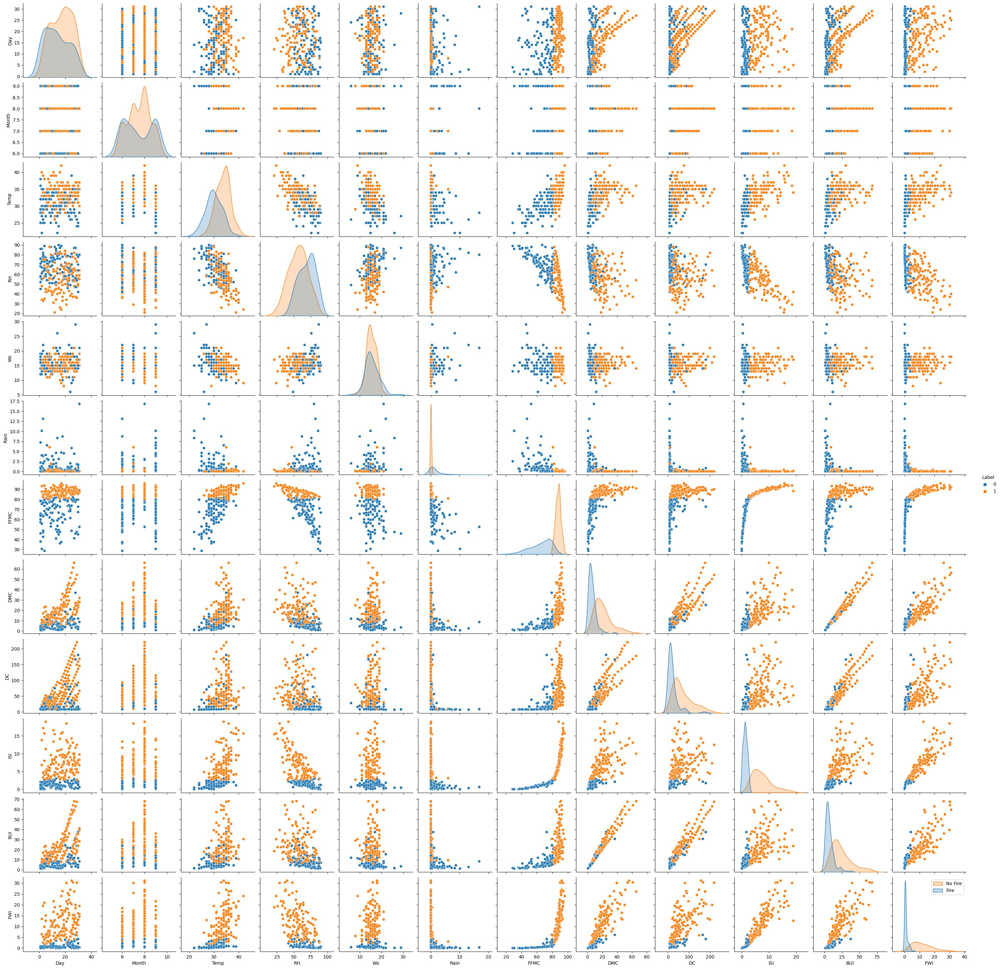

In [ ]:
#seaborn as sns is used
#pre scale
plot_frame = data

sns.pairplot(plot_frame, hue = "Label")
plt.legend(["No Fire", "Fire"])



####Explaination of Data
So from the pairplot above, We can see a general trend of Blue dots(representing that there is not a fire) being group toegether, with Orange dots(representing that there is a fire) doing something similar but more spread out away from the norm where there is nofire.<br>

From the plots above, We can see for most of the features, there is always a **distinct** point where it goes from "nofire" to "fire". <br>
For example:
- "Rain" total rain in mm
- "FWI" fire weather index, where the following are the componments of this index
  - "FFMC" fine fuel moisture code(indication of moisture in fuel to sustain fires)
  - "DMC" moisture level of loosely compacted organic matter underneath litter.
  - "DC" moisture content of deep compact organic layer
- "ISI" index based on wind speed and ffmc
- "BUI" index for build up of fuel, based on DMC and DC


And in the 7 features, specically "Rain" and "FFMC" has a high corralation to the outcome, as demonstrated by their univariate distribution plots(diagonal-graphs)

---



####Exploring indivual graphs from the pairplot




---

#####From the pairplot, we will be exploring "Month plotted against itself

6    60
9    60
7    61
8    62
Name: Month, dtype: int64


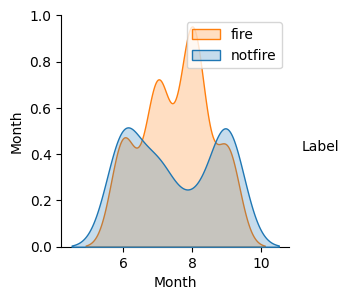

In [ ]:
# Extract the "Month" column from the original DataFrame
month_frame = feature_frame["Month"]
month_count = month_frame.value_counts(normalize = False,)
print(month_count)

# Create a new DataFrame with "Month" and "Label" columns
df = pd.concat([month_frame, label_frame], axis=1)

# Plot pairplot using seaborn
sns.pairplot(df, height = 3, hue="Label")
plt.legend(["fire", "notfire"])


From the univariate distrubition graph where blue represents "not fire" and orange represents "fire":
- we can see that there are more cases of fire between june(6) and auguest(8)
- and we can see that there are slightly less fire cases in month of june(6) and september(9)-october(10).

#####From the pairplot, we will be exploring "Temp", "RH", "Ws", plotted against "FFMC"

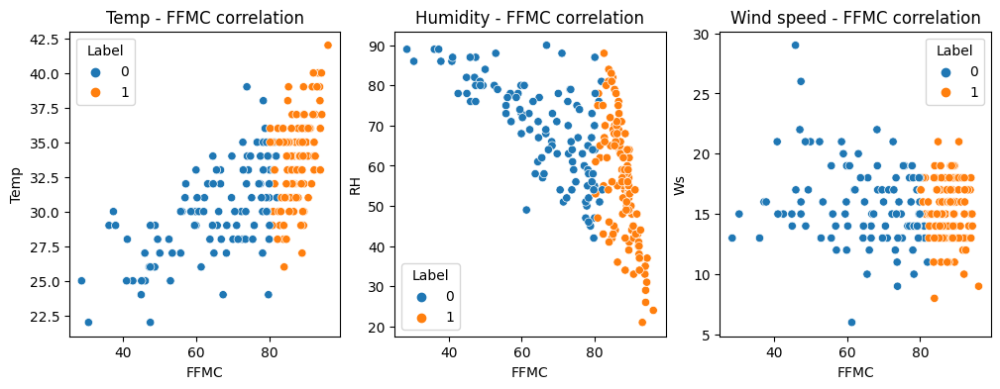

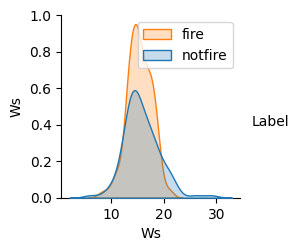

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#create each frame

temp_frame = data[["Temp", "FFMC", "Label"]]
RH_frame = data[["RH", "FFMC", "Label"]]
Ws_frame = data[["Ws", "FFMC", "Label"]]
Ws_frameUni = data[["Ws", "Label"]]

#create a subplot of 3 graphs
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(12,4))
ax1.set_title("Temp - FFMC correlation")
ax2.set_title("Humidity - FFMC correlation")
ax3.set_title("Wind speed - FFMC correlation")

#generate each plot and assign for each ax
sns.scatterplot(temp_frame, x = "FFMC", y = "Temp", hue = "Label", ax = ax1)
sns.scatterplot(RH_frame, x = "FFMC", y = "RH", hue = "Label", ax = ax2)
sns.scatterplot(Ws_frame, x = "FFMC", y = "Ws", hue = "Label", ax = ax3)
sns.pairplot(Ws_frameUni, hue = "Label")
plt.legend(["fire", "notfire"])

From the 3 plots, we can observe that the relation with FFMC:

- for Temp, we can see a trend as temperature rises, FFMC also rises
- for RH(humidity), we can see a trend as humidity lowers, FFMC rises
- but for Ws(windspeed), there isn't an obvious trend to be observed.

as for FFMC
- it's common in the 3 graphs that when FFMC reaches 80, it results in a fire

**We can see a cause and effect relationship between the 2 variables("Temp", "RH") and "FFMC". Where the effect of the 2 labels have an affect on "FFMC", and in turn, the outcome of a fire or not.**


---

As for Ws from the univariate distrubition graph, **we can see that it may not have a significant affect on whether it causes a fire or not**. This could explain why it does not have much of a correlation between "Ws" and "FFMC"


---



#####From pairplot, we will be exploring "Rain"

<Axes: title={'center': 'Rain'}, ylabel='Label'>

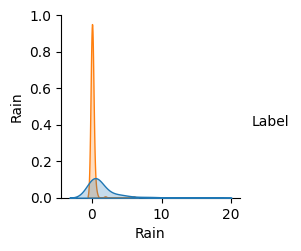

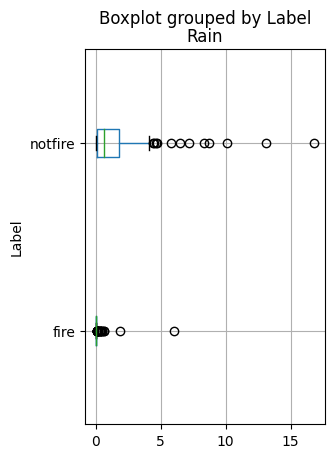

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

#create the frames
Rain_frame = data[["Rain", "Label"]]

#univeriate distrubtion graph
sns.pairplot(Rain_frame, hue = "Label")


#box plot
#plt.boxplot(Rain_frame["Rain"], vert = 0)
Rain_frame.boxplot(column = "Rain", by = "Label", vert = 0, figsize = (3,5))

From these 2 graphs, we can observe that:
- It only **results in fire in most cases when there is little to no rain** according to the boxplot. Apart from a few edge cases. '
- Most notfire cases are **causes by presents of rain in most case**. >99.7% of no fire cases are within 5mm of rain.

**It can be said that "Rain" has a large effect on whether there is a fire, and there isn't a fire according to above graphs.**

####Exploring staticial data:


#####Pie chart of percentage between "fire" and "notfire"

fire       137
notfire    106
Name: Label, dtype: int64
fire       0.563786
notfire    0.436214
Name: Label, dtype: float64


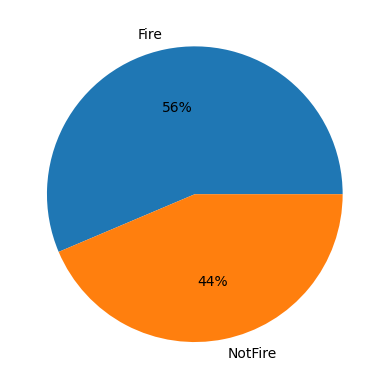

In [ ]:
import matplotlib.pyplot as plt

count = label_frame.value_counts(normalize = False)
print(count)
percent_fire_notfire = label_frame.value_counts(normalize = True)
print(percent_fire_notfire)

labels = ["Fire", "NotFire"]
plt.pie(percent_fire_notfire, labels = labels, autopct = "%1.f%%")
plt.show()

From the piechart above:
- we can see the given data set are distributed about evenly, with 56.4% of data being "fire", and 43.6% being "notfire"
- a bias towards "fire" may affect the model's performance. As in the real world, a chance of a having "fire" is much lower than "notfire"

**The piechart may not accurately reflect the real-world situation of forest fires, as it shows more "fire" than "nofire" cases. This could be different from the actual statistics of forest fires.**


---



#####Distribution of the temperature of our data

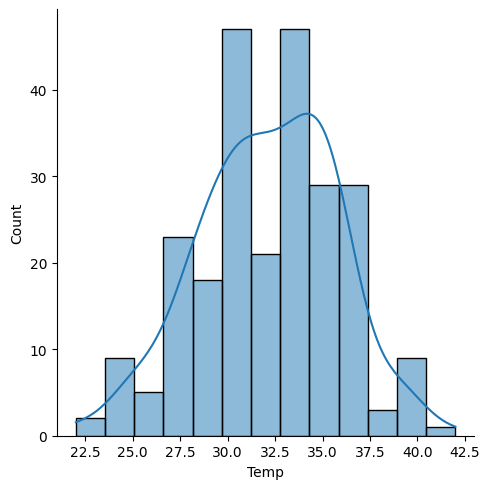

In [ ]:
import seaborn as sns
import pandas as pd

temp_frame = data["Temp"]
#create distrubition plot
sns.displot(temp_frame, kde = True)

From this graph, it shows both a bar plot and a curve plot of the frequency for each temperature. We can see that:
- The density curve shows that it shows features of a bell curve for standard distribution
- While the histogram shows that there are possible missing values when compared to the curve. Examples are:
  - temperatures at approximately 25, 29, 31 and at 37.5.
- generally, we also can see that the data given in terms of temperature is consistant with the real world

**Missing data points can affect the validity and accuracy of statistical analysis and interference. (Bhandari, P. 2020) Missing data points could potentically also affect the model's accuracy.** <br>
- *To improve the accuracy, We could conduct a longer period of data collections to even out our bell curve*

---



####Explore standardising the data
By standardising the data, it helps the model learn quicker and even make it more accurate. As demonstrated below, after scaling no significant changes can be observed.


---



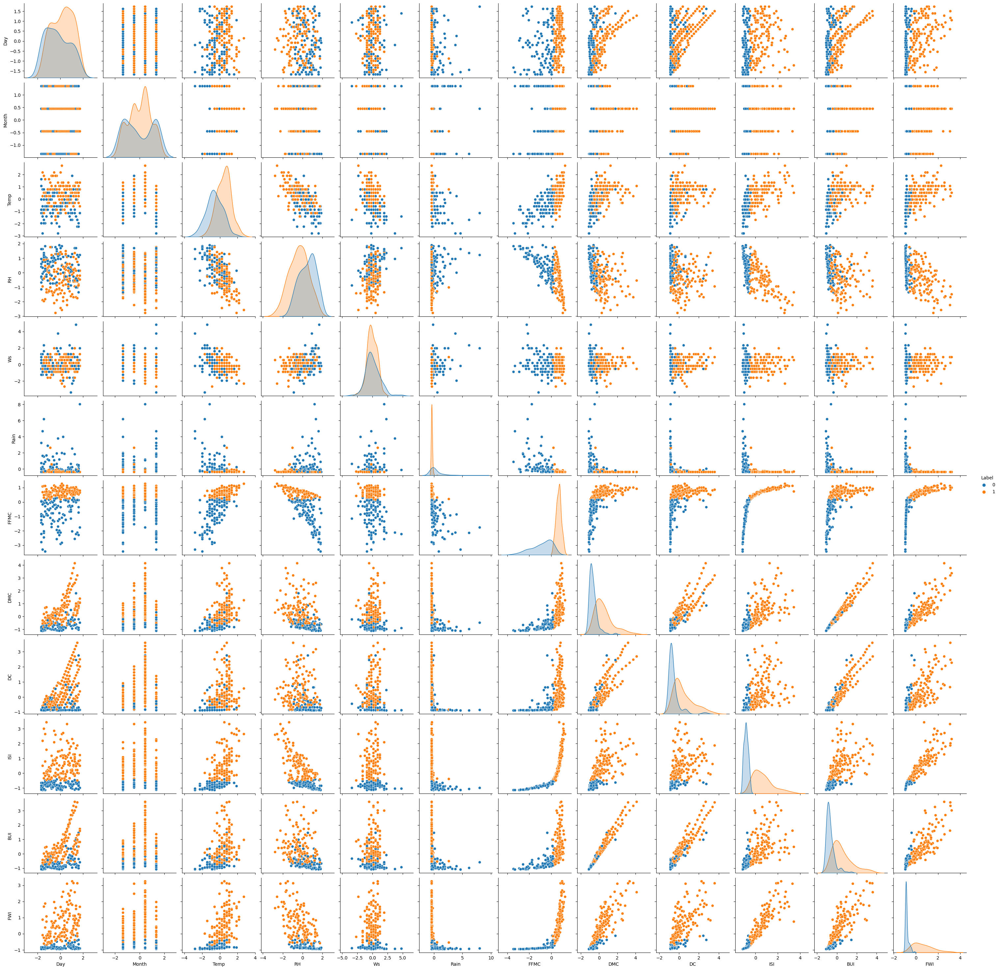

In [ ]:
#after scale
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
# fit
standardised_feature_frame = scaler.fit_transform(feature_frame)
# well ^standardised_feature_frame gave us a NumPy, we need dataframe
standardised_feature_frame = pd.DataFrame(standardised_feature_frame, columns = feature_frame.columns)

#Okay, time to add label frame to it!
standardised_feature_frame["Label"] = label_frame

#seaborn :D
sns.pairplot(standardised_feature_frame, hue = "Label")

#old way of doing it!
#standardised_feature_frame = (feature_frame - feature_frame.min()) / (feature_frame.max() - feature_frame.min())
#standardised_feature_frame["Label"] = label_frame

##Task 3: MODEL TRAIINGNGNGNGNNNG
well from all the models avaliable in sk, it's down to either using linear regression or decision tree classifier. Both have their own positives but in this instance, decision tree classifier would probably be a better choice.<br>
later in the process, we will be comparing the both according to the accuracy.

###Step 1: train and test
I've choosen train test split(apart from it being specifically what I needed)<br>
It's able to randomly select one part data for training, and the other part for testing the model trained by the training data from the 243 given rows. <br>
as stated above, I'll be using standardising data, as it will make the model quicker, and most importantly: **more accurate**! (I'll be comparing the both)<br>

ONE MORE THING: To scale our data, **only** scale after splitting them, and **only** fit our scaler on our **train data**, then scale our test data using the scaler from train data. <br>

 Reasoning is that: <br>
 - We want to avoid data leakage and ensure that the model is trained and tested on seperate sets of data.
 - We don't want to be using information from the test data to transform the train data! if we scaled it **before** test splitting it, it will result in train data having info from the scaler of the test data, which is bad bad.

---

I'll first have random state set as "1" for consistancy between standardised and non standardised dataset. After that, I'll be setting it as 42 for robust testing

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# train-test split: 80/20 ("industry" standard xd)

# time to split!

X_train, X_test, Y_train, Y_test = train_test_split(feature_frame, label_frame, test_size = 0.2, random_state = 1)

# getting the Standardised part!
# objects scaler
scaler = StandardScaler()

# okay fitting it again
standardised_X_train = scaler.fit_transform(X_train)

# scale X_test with the object
standardised_X_test = scaler.transform(X_test)

###Step 2: visualise the split
Using seaborn pairplot, we can visually see whether the train and test features are consistant of one another

from the graphs, it is safe to say that both train and test features are somewhat consistant of one another. From some of the randomness, it's to be expected.

---


We will be using the standardised feature data to be plotted against(from this point on we will be using standardised data for accuracy and standardisation, apart for when we need to compare both).

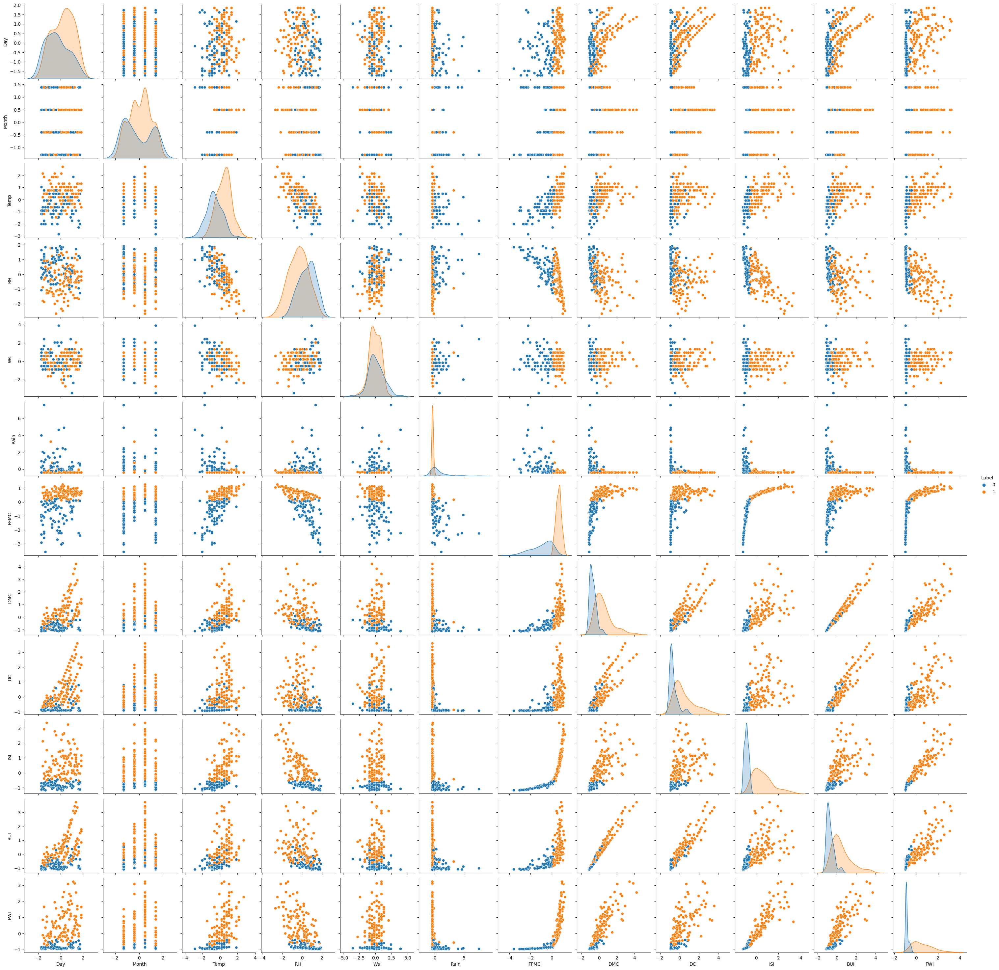

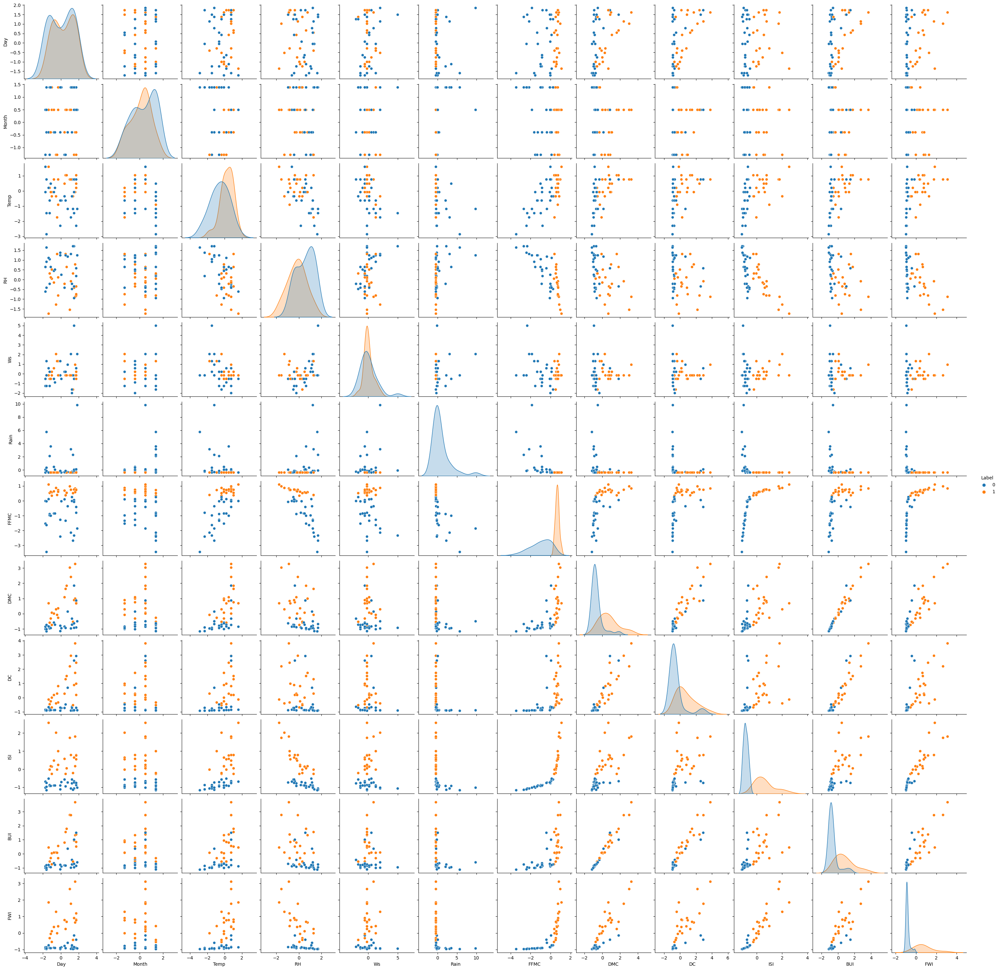

In [ ]:
# converting train and test features to DataFrame
df_X_train = pd.DataFrame(standardised_X_train, columns = feature_frame.columns)
df_X_test = pd.DataFrame(standardised_X_test, columns = feature_frame.columns)

# converting train and test labels to DataFrame
# ugh have to reset the index too :/
df_Y_train = pd.DataFrame(Y_train, columns = ["Label"])
df_Y_train = df_Y_train.reset_index(drop=True)
df_Y_test = pd.DataFrame(Y_test, columns = ["Label"])
df_Y_test = df_Y_test.reset_index(drop=True)

# combining feature X and label Y by train and test
df_train = pd.concat([df_X_train, df_Y_train], axis = 1)
df_test = pd.concat([df_X_test, df_Y_test], axis = 1)

# seaborn both!
sns.pairplot(df_train, hue = "Label")
sns.pairplot(df_test, hue = "Label")

###Step 3: Exploring PCA
In this case before creating a decision tree classifier, I'll first do a PCA model to help in making our data more efficient for the model.
PCA model prediction is used in
- reducing dimensionality of data, helps removes noise which improves efficiency and performance of the model we're going to train(EngrStudent, 2013)
- it captures most of our data with lower component counts.

####N-components
first we need to determine our optimal n component count to reduce noise and significantly reduce our model size

[ 49.58478598  63.87846897  72.56100924  81.10735039  87.86048442
  92.14612796  95.15297183  97.23575142  99.06809814  99.85162603
  99.99200693 100.        ]


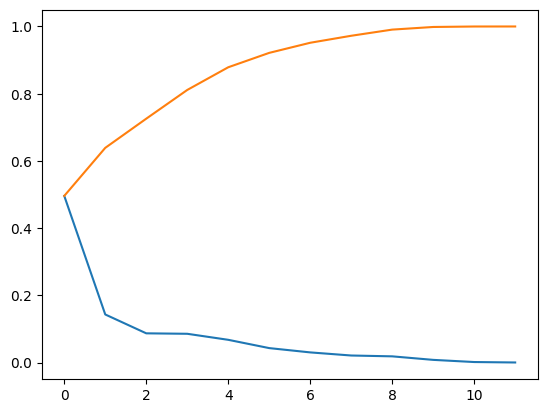

In [ ]:
from sklearn.decomposition import PCA
import numpy as np

#pca object
pca_n = PCA()
pca_n.fit(standardised_X_train)
line1 = pca_n.explained_variance_ratio_
plt.plot(line1)
plt.plot(np.cumsum(line1))
print(np.cumsum(line1)*100)

from the graph above:
- we can see that at around **8 n-components, we are able to represent over 99.5% of our data**

Having our n-component reduced, we're able to **reduce the dimentionality of our data,** which can inturn **improve the efficiency and accuracy** of our model's prediction.

###Step 4: trying our models
Below, we will be creating 4 seperate models, then check their accuracies together. The following 4 models:
1. decision tree classifier: Our pure decision tree diagram, only taking our original non scaled data. Serving somewhat as a control test
2. decision tree classifier using standardised data: We first scale our data, before sending it into our model. To be compared to our original decision tree classifier
3. decision tree clasifier using PCA data: First scaled, then through our PCA model. Reasons are stated above. Aiming to have our model to be more efficient and accurate.
4. decision tree classifier using reduced n-component PCA data: same process as above, tho we limit to just 8 n-components.



---



####**1.** Our base test: Decision tree classifier:

In [ ]:
# decision tree first!
from sklearn import tree

#create DTF object
dtf = tree.DecisionTreeClassifier()
#train!
dtf = dtf.fit(X_train, Y_train)

#now test!
dtf_prediction = dtf.predict(X_test)
print(dtf_prediction)


[1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0
 0 0 1 0 0 0 1 0 0 1 1 1]


####**2.** Decision tree classifier with Standardised data
Quick note once again:
- We only scale after splitting, to avoid data leakage, where information on our test cases were passed onto our train data via the scaler

In [ ]:
from sklearn import tree

#create DTF object
dtf2 = tree.DecisionTreeClassifier()
#train!
dtf2.fit(standardised_X_train, Y_train)

#test
dtf2_prediction = dtf2.predict(standardised_X_test)
print(dtf2_prediction)

[1 0 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 0 1 0 0 1 1 1 0
 0 0 1 0 0 0 1 0 0 1 1 1]


####**3.** Decision tree classifier with PCA data
In this step it will be more complicated, as we need to also code for the PCA model

In [ ]:
from sklearn import tree
from sklearn.decomposition import PCA

#create a PCA object
pca = PCA()
#fit then transform both standardised_X_train and standardised_X_test
pca_X_train = pca.fit_transform(standardised_X_train)
pca_X_test = pca.transform(standardised_X_test)

#create a dtf object
dtf_pca = tree.DecisionTreeClassifier()
#train
dtf_pca.fit(pca_X_train, Y_train)

#test
dtf_pca_prediction = dtf_pca.predict(pca_X_test)
print(dtf_pca_prediction)


[1 0 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 0
 0 0 1 0 0 0 1 0 1 1 1 1]


NOTE: The reason why we standardized the data before fitting into a PCA model, is that **features with large scales and variance will skew the PCA's result** and **affect the contribution given by each feature**. It is imparitive to **always standardize our data before fitting** into a PCA model(Datagy. 2022)

####**4.** Decision tree classifier with PCA reduced n components
Similar to our 3rd test, though now with a limited to 8 components

In [ ]:
from sklearn import tree
from sklearn.decomposition import PCA

#create a PCA object
pca2 = PCA(n_components=8)
#fit then transform both standardised_X_train and standardised_X_test
pca_X_train2 = pca2.fit_transform(standardised_X_train)
pca_X_test2 = pca2.transform(standardised_X_test)

#create a dtf object
dtf_npca = tree.DecisionTreeClassifier()
#train
dtf_npca.fit(pca_X_train2, Y_train)

#test
dtf_npca_prediction = dtf_npca.predict(pca_X_test2)
print(dtf_npca_prediction)


[1 0 1 0 1 0 1 1 0 0 0 1 0 0 1 0 1 0 1 0 0 1 0 0 1 0 0 1 0 1 1 0 0 1 1 1 0
 0 0 1 0 0 0 1 0 1 1 1 1]


###Step 5: Comparing accuracy score
We will be following the same order as before, showing each model's accuracy score and confusion matrix.<br>

Order:
1. Base Decision Tree Classifier
2. Decision Tree Classifier with Standardised data
3. Decision Tree Classifier with PCA Data
4. Decision Tree Classifier with reduced n-component PCA Data

####**1.** Base Decision Tree Classifier

1.0


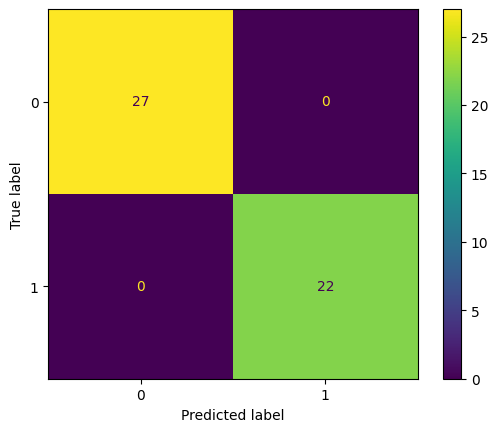

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#generate accuracy of DTF
accuracy = accuracy_score(Y_test, dtf_prediction)
print(accuracy)

#SO I am confusion
dtf_cm = confusion_matrix(Y_test, dtf_prediction)
display = ConfusionMatrixDisplay(dtf_cm)
display.plot()

#####from the confusion matrix representing our accuracy on our standardised data
Using just decision tree classifier itself, we're able to predict all our test data correctly. For both out of **27** cases of "notfire", and **22** cases of our "fire" cases.

####**2.** Decision Tree Classifier with Standardised data

1.0


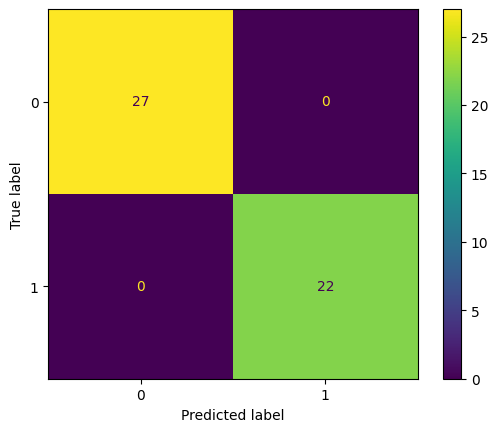

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#generate accuracy of DTF
accuracy2 = accuracy_score(Y_test, dtf2_prediction)
print(accuracy2)

#why is this one kansas
dtf_cm2 = confusion_matrix(Y_test, dtf_prediction)
display2 = ConfusionMatrixDisplay(dtf_cm2)
display2.plot()

#####And from the confusion matrix above
applying standization on our train and test data, we're also able to successfully predict all of our test cases. For both out of **27** cases of "notfire", and **22** cases of our "fire" cases.

The reason why we did not see an imporvment between the 2 methods(method 1 and method 2) and apartly caused by our **original decision tree classifier achiving 100% accuracy and hence no area to be improved on,**

This demonstrated that decision tree classifiers are not sensitive to scaling the features(Dategy.io. 2022). And hence not required to normalize nor standardise our data.

*We can further investigate the differences and performance by using a significantly larger dataset.*


####**3.** Decision Tree Classifier with PCA Data

0.9387755102040817


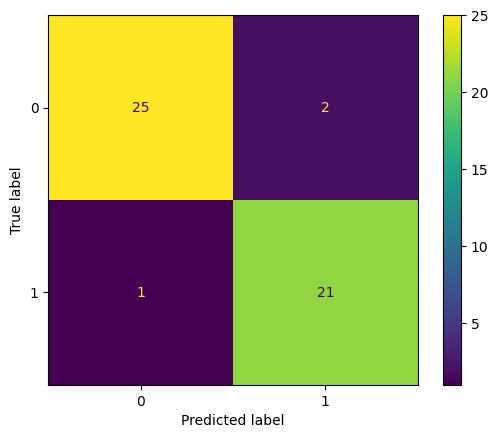

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#generate accuracy of pca dtf
accuracy3 = accuracy_score(Y_test, dtf_pca_prediction)
print(accuracy3)

#but this one is not "ar"kansas
dtf_cm3 = confusion_matrix(Y_test, dtf_pca_prediction)
display3 = ConfusionMatrixDisplay(dtf_cm3)
display3.plot()

#####As for our confusion matrix and percentage that represents using PCA's data for training:

- It resulted in having a 93.9% accuracy score, lower than that of just using decision tree classifier.

- Of our "notfire" cases represented by label "0", 25 out of 27 cases were predicted correctly by our model, while misidentify 2 of our cases as "fire"
- For our "fire" cases represented by label "1", 21 out of 22 cases were predicted correctly by our model, while misidentify 1 of our case as "notfire"

For the case where the model predicted a "fire" case as "notfire", it may **cause significant problem** as the **misleading data could delay any ememrgency responses**. Leading to a **lost of capital** and **posibily human life**.

*We should not fully rely on predictions made by the model, as we should always conduct other means of assessment to validate the predictions of the model.*



####**4.** Decision Tree Classifier with reduced n-component PCA Data

0.9387755102040817


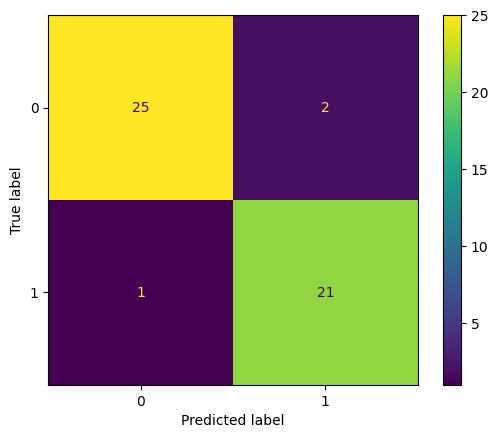

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

#generate accuracy of pca dtf
accuracy4 = accuracy_score(Y_test, dtf_npca_prediction)
print(accuracy4)

#WDYM Arkan-"saw"
dtf_cm4 = confusion_matrix(Y_test, dtf_npca_prediction)
display4 = ConfusionMatrixDisplay(dtf_cm4)
display4.plot()

#####For the last confusion matrix and accuracy score that represents using reduced n-component PCA's data for training:
- It resulted in having a 93.9% accuracy score, same as the previous PCA and lower than just using decision tree diagram over our original data.
- "notfire" cases represented by "0", 25 out of 27 cases were predicted correctly by our model, while misidentify 2 of our cases as "fire"
- "fire" cases represented by label "1", 21 out of 22 cases were predicted correctly by our model, while misidentify 1 of our case as "notfire"

results given here may also cause the same problem as stated above.

*It's important that we should not fully rely on prediction given by models*


##Task 4: Discussion of Result


###results on accuracy score of our 4 methods:

####This is a table that demonstrates each method's accuracy score
The accuracy score was gotten from above using their respective variables

In [ ]:
import pandas as pd

methods = [["dtf", accuracy], ["scaled dtf", accuracy2], ["PCA", accuracy3], ["reduced PCA", accuracy4]]
method_frame = pd.DataFrame(methods, columns = ["methods", "accuracy score"])
print(method_frame)

       methods  accuracy score
0          dtf        1.000000
1   scaled dtf        1.000000
2          PCA        0.938776
3  reduced PCA        0.938776


####From the table above:
- we can see the accuracy score for both our dtf method and scaled dtf had the same accuracy score of 100%. As stated at the original confusion matrix:
  - original decision tree classifier achiving 100% accuracy and hence no area to be improved on
  - decision tree classifiers are not sensitive to scaling the features

- and for PCA and reduced PCA, they both achieved the same accuracy score of 93.9%, lower than without using PCA. This does not allign with my personal assumptions. possible reasons are:
  - From an online comment, PCA reduces the dimentionality of the data, which in the process some information may have been lost. Affecting prediction accuracy(Validated, C. 2015)
  - as stated before, decision tree classifier are not sensitive to scaling. Standardising was a step during the creation of a PCA model(Dategy.io. 2022).
  - from a professor in an online forum, PCA is not a discriminative method. So may lead to it not capturing the features that are important for calssification(Artur, J. 2018).

Apart from above statement, with both PCA and reduced n-component PCA having the same accuracy score, this has shown that:
- at 10 n-components for the PCA verses 8 n-components for the reduced n-component PCA:
  - this has shown that in certain situation we're able to reduce n-component in cost of little to no lost in accuracy, in trade of maybe a decrease in model size(not true in this case shown below). Leading to more efficient or even more accurate models.

#####Important:
it is important to again point out, as shown in both PCA methods,** we should not fully rely on predictions given by the model.**

As specially for the case where the model **predicted a "fire" case as "notfire",** it may cause significant problem as the **misleading data could delay any ememrgency responses.** Leading to a **lost of capital and posibily human life.**

####Quick exploring of the 2 PCA method's decision tree diagram:

#####First PCA tree at 10 n-component

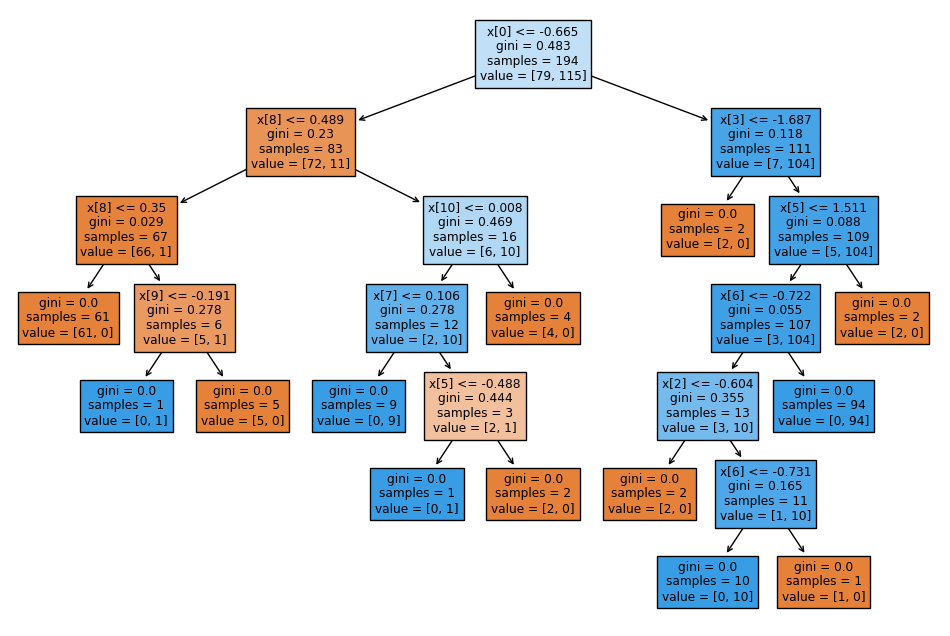

In [ ]:
#visualising the tree

exp = tree.export_text(dtf_pca)
fig = plt.figure(figsize = (12, 8))
a = tree.plot_tree(dtf_pca, filled = True)

#####First PCA tree at 8 n-component

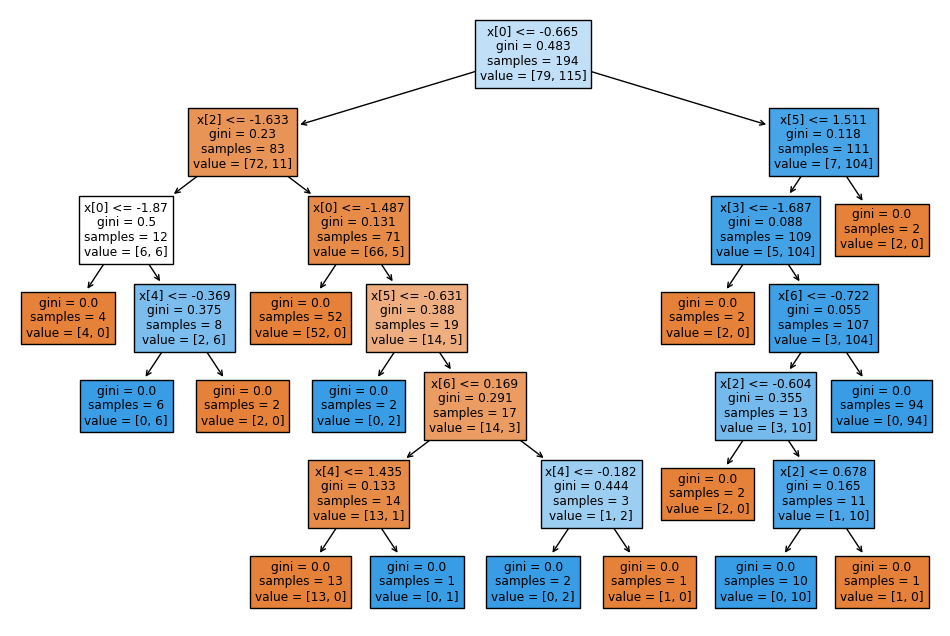

In [ ]:
#visualising the tree

tree.export_text(dtf_npca)
fig2 = plt.figure(figsize = (12, 8))
a2 = tree.plot_tree(dtf_npca, filled = True)

####From these tree diagrams
We found out that when we reduced n-components, the model ended up with more sub routes.
Personal thoughts were that with a reduced n-components the model will be smaller than with all 10 pca n-components. Yet another surprise for me

##Task 5: Conclusion
Below, I'll be concluding what this research has yielded, in terms of which model to choose and what needs improving.


###Findings:
From this research regarding to forest fires and applying different classification methods in predicting outcome of fire or notfire. We've done comparisons of 4 methods:
- decision tree classifier
- decision tree classifier with standardized data
- decision tree classifier with PCA data
- decision tree classifier with reduced n-component PCA data.

the first 2 methods achieved **100% accuracy score**, while the latter half achieven **93.9% accuracy score**. We've explored possible reasons behind the result, and the implications of using model prediction for real world usecases(forest fire).

This has proven that mechine learning is **a power muti tool that can be applied in a load of different cases.** While also showing that mechine learning is not the **ultimate solution for all problems.**

In use cases of model prediction, we should** always validate and evaulate** our mechine models before **deploying and trusting in their predictions**.

###Reason of choosing to use a Decision Tree Classification:
- From a online guide by Waseem, decision tree classification is a **supervised learning approach** in mechine learning(Waseem, M. 2023). Where supervised learning means the given data are all of **labeled examples**, which we do have currently!
- For reasons why we did not use a PCA model before building a model, we've shown that it doesn't accurately predice most of our test cases, compared to just decision tree classification's 100% accuracy. Its known that tree calssification isn't affected much by scaling(PCA, standarising).

#CITE

Based on web search results, a possible citation for this page is:

WHO. (n.d.). Wildfires. https://www.who.int/health-topics/wildfires#tab=tab_1

EngrStudent. (2013, April 3). How does PCA improve the accuracy of a predictive model? [Online forum comment]. Cross Validated. https://stats.stackexchange.com/questions/55034/how-does-pca-improve-the-accuracy-of-a-predictive-model


Datagy. (2022). Decision Tree Classifier with Sklearn in Python. https://datagy.io/sklearn-decision-tree-classifier

Cross Validated. (2015, April 1). Applying PCA to test data for classification purposes. https://stats.stackexchange.com/questions/144439/applying-pca-to-test-data-for-classification-purposes

Jordão, Artur. (2018, December 6). Re: The effect PCA in decision tree. [Online forum comment]. https://www.researchgate.net/post/the_effect_PCA_in_decision_tree/5c09116d0f95f190971b1190/citation/download.

Why did I even site xd
